# Figures for publication

In [2]:
pip install dask distributed --upgrade

Note: you may need to restart the kernel to use updated packages.


In [8]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import matplotlib as mpl
import seaborn as sns
import os
from pathlib import Path
import time
import copy
import joblib
label_cmap = mpl.cm.get_cmap('Set2')(range(8))
from skimage import color

try:
    import libpysal
    from libpysal.cg.voronoi  import voronoi, voronoi_frames
    from libpysal.weights import Queen, Rook
except ModuleNotFoundError:
    raise Exception("""
    If you want to reproduce results in the publication, install also PySAL with:
    pip install libpysal geopandas shapely""")

/tmp/ipykernel_3505/3587115398.py:11: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
  label_cmap = mpl.cm.get_cmap('Set2')(range(8))


In [4]:
# Convenient IPython console
# comment it if you execute Jupyterlab on a remote server

%qtconsole --style monokai

In [9]:
try:
    from tysserand import tysserand as ty
except ModuleNotFoundError:
    print("tysserand is not installed, you can install it with `pip install tysserand`")
    print("loading tysserand from local files...")
    # If you haven't installed tysserand with pip, but its code is on your hard drive:
    import sys
    sys.path.extend(['../../tysserand']) # change directory accordingly
    from tysserand import tysserand as ty
    print("tysserand loaded successfully")

tysserand is not installed, you can install it with `pip install tysserand`
loading tysserand from local files...
tysserand loaded successfully


In [6]:
SMALL_SIZE = 20
MEDIUM_SIZE = 20
BIGGER_SIZE = 25

mpl.rc('font', size=SMALL_SIZE)          # controls default text sizes
mpl.rc('axes', titlesize=SMALL_SIZE)     # fontsize of the axes title
mpl.rc('axes', labelsize=MEDIUM_SIZE)    # fontsize of the x and y labels
mpl.rc('xtick', labelsize=SMALL_SIZE)    # fontsize of the tick labels
mpl.rc('ytick', labelsize=SMALL_SIZE)    # fontsize of the tick labels
mpl.rc('legend', fontsize=15)    # legend fontsize
mpl.rc('figure', titlesize=BIGGER_SIZE)  # fontsize of the figure title

# set to True is you want to run the quite long lasting benchmarks
RUN_BENCHMARKS = False
# directory to save images for the scientific paper
imdir = Path("../image_test")

## Delaunay triangulation

In [7]:

import imageio.v2 as imageio

# Ouvrir l'image TIFF de grande taille
img = imageio.imread("../data/mIF_WSI_tile/HumanOvarianCancerPatient2Slice2_images_mosaic_Cellbound1_z0.tiff")

In [8]:
img.shape

(43083, 65824)

In [9]:
img2 = img[12000:12500, 12000:12500]

In [10]:
# With a small tissue network
# img = plt.imread("../data/mIF_WSI_tile/tile.png")
meta_data = pd.read_csv('~/Documents/stage_inserm/data/HumanOvarianCancerPatient2Slice2_cell_metadata.csv')
print(meta_data.shape)
meta_data2 = meta_data[12000:12500]
coords = meta_data2.loc[:,['center_x','center_y']].values
pairs = ty.build_delaunay(coords, trim_dist=False)
distances = ty.distance_neighbors(coords, pairs)

(71381, 9)


In [11]:
coords.shape

(500, 2)

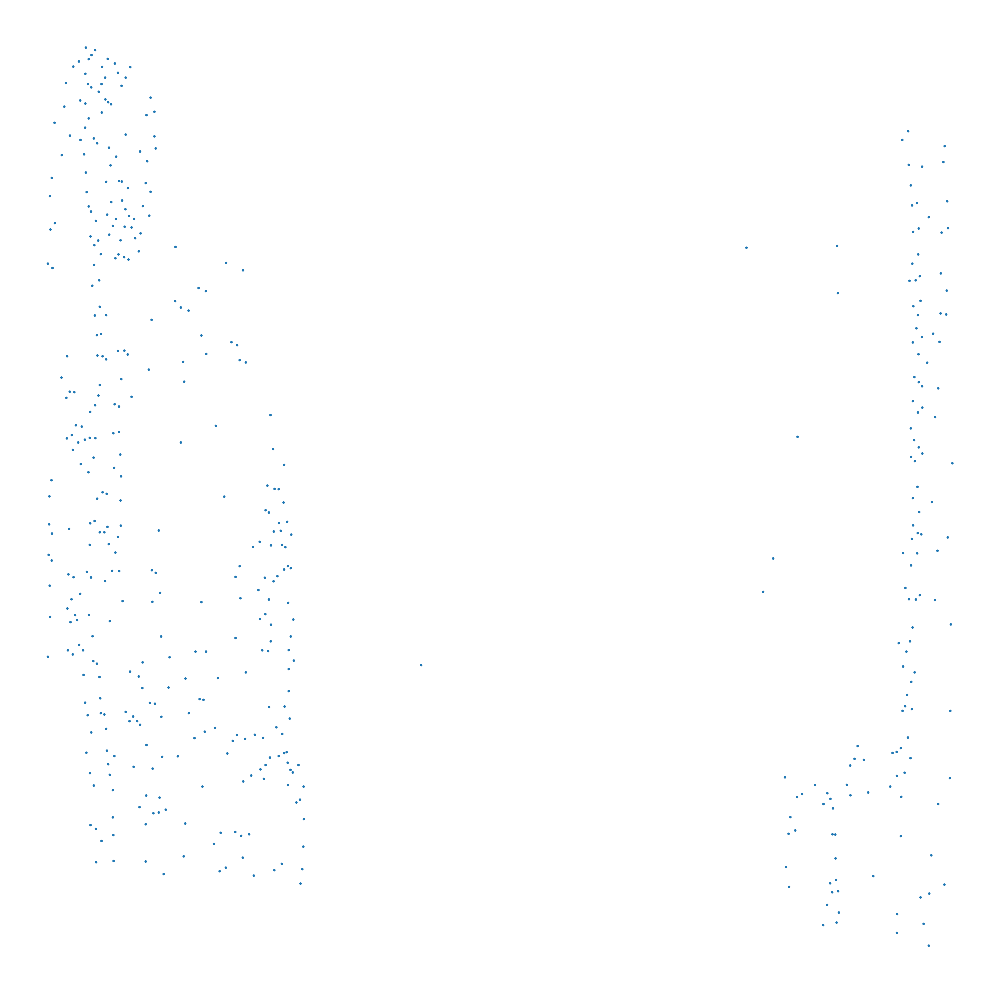

In [12]:
plt.figure(figsize=(50,50))
plt.scatter(coords[:,0], coords[:,1])
plt.axis('off')
plt.savefig(imdir.joinpath('mIF - nodes positions'), bbox_inches=('tight'))

In [13]:
meta_data

,Unnamed: 0,fov,volume,center_x,center_y,min_x,max_x,min_y,max_y
0,7650,1413,2164.001882,10145.793273,5611.686548,10135.374848,10156.211698,5602.912342,5620.460755
1,7654,1413,799.191933,9975.309392,5626.726410,9969.399281,9981.219504,5621.396968,5632.055852
2,7655,1413,1499.366735,10129.182535,5630.601069,10120.147947,10138.217123,5623.778992,5637.423145
3,7656,1413,1476.039756,10112.691788,5635.037877,10106.215328,10119.168248,5626.804584,5643.271170
4,7657,1413,1076.872046,10151.573577,5634.673399,10146.395020,10156.752135,5627.678259,5641.668539
...,...,...,...,...,...,...,...,...,...
71376,17845,1958,296.890865,10003.931311,10127.617506,10000.592767,10007.269856,10123.928582,10131.306430
71377,17846,1958,722.081647,10196.370832,10137.641788,10190.151248,10202.590415,10131.866041,10143.417536
71378,17847,1958,351.389038,10134.328193,10184.749637,10130.839066,10137.817320,10180.632494,10188.866779
71379,17850,1958,754.320421,10011.495350,10049.177307,10007.284364,10015.706336,10040.688113,10057.666500


In [14]:
# make colors for nodes
# marker --> DAPI 5060C, FITC+TxRed-A-2, FITC+TxRed-A-1 
# class_colors --> orange, blue, green
# class_colors = ['#ff7f0e', '#1f77b4', '#2ca02c']
# classes = list(nodes['class'].unique())
# dico_col = {classes[0]:class_colors[2],
#             classes[1]:class_colors[1],
#             classes[2]:class_colors[0]}
# colors = [dico_col[x] for x in nodes['class']]

# plt.figure(figsize=(10,10))
# plt.scatter(coords[:,0], coords[:,1], c=colors)
# plt.axis('off')
# plt.savefig(imdir.joinpath('mIF - nodes positions classes'), bbox_inches=('tight'))

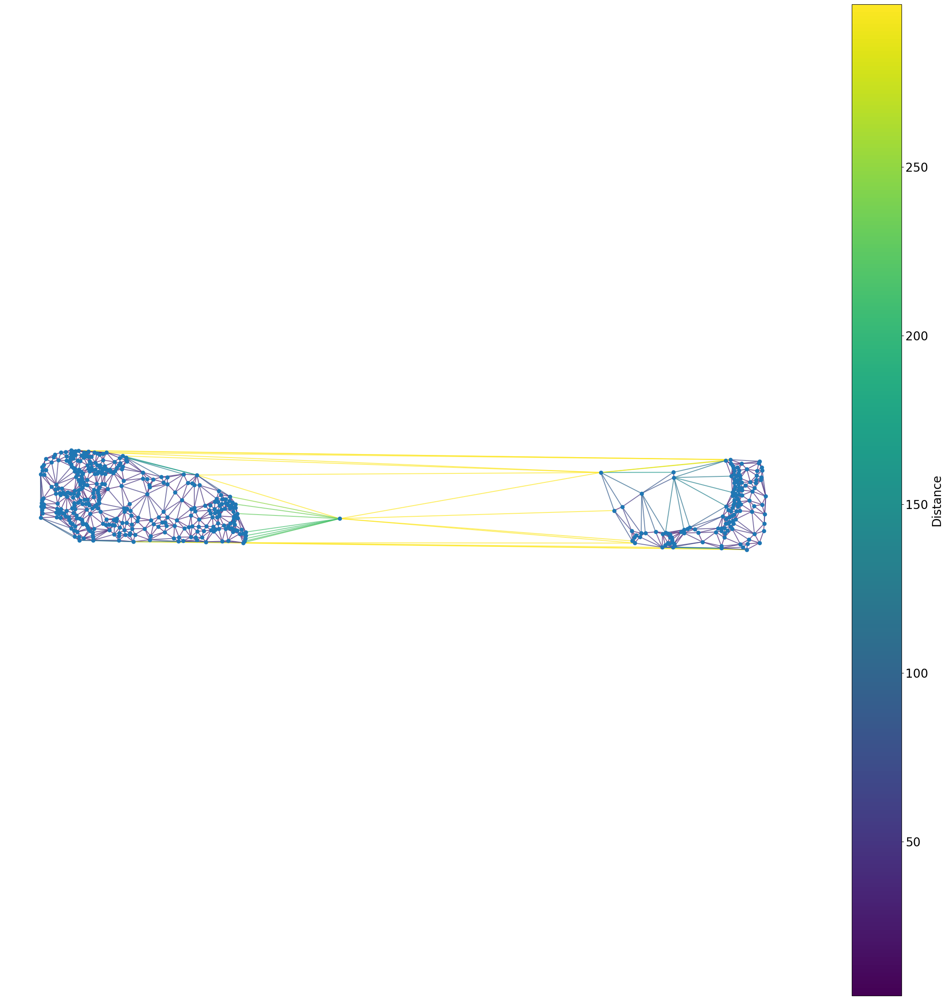

In [15]:
ty.plot_network_distances(coords, pairs, distances, figsize=(30,30))
plt.axis('off')
plt.savefig(imdir.joinpath('mIF - Delaunay distances'), bbox_inches=('tight'))

In [16]:
dist_threshold = 110
select = distances < dist_threshold
pairs = pairs[select,:]

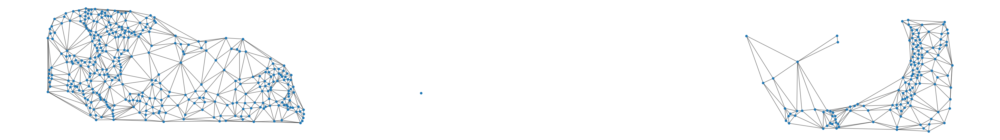

In [17]:
ty.plot_network(coords, pairs, figsize=(50,50))
plt.axis('off')
plt.savefig(imdir.joinpath('mIF - Delaunay network'), bbox_inches=('tight'))

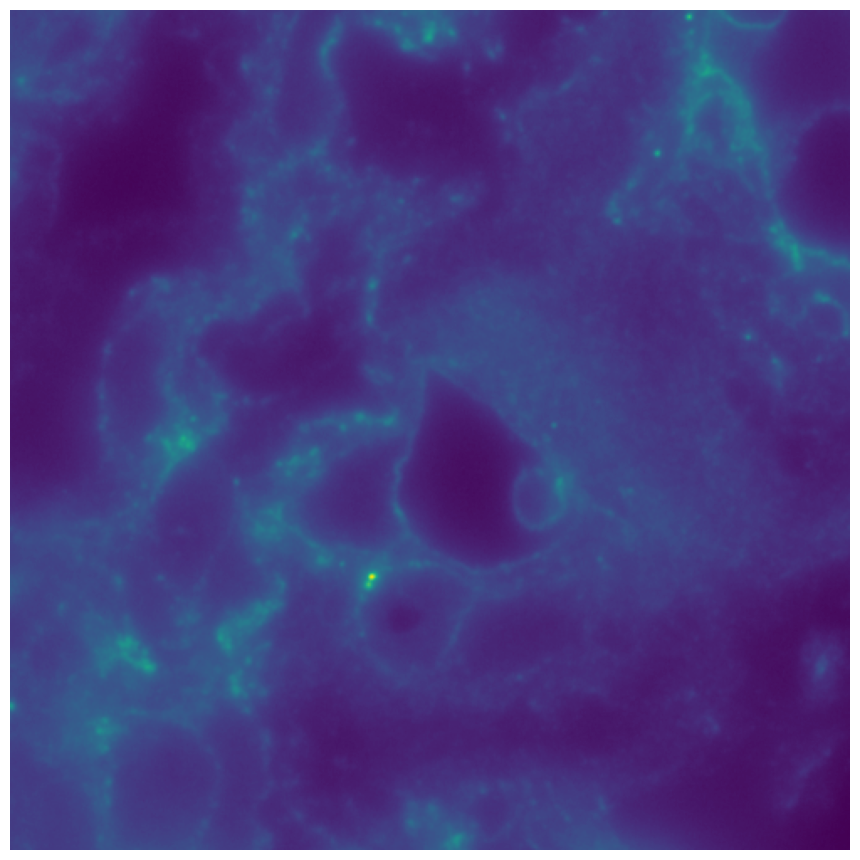

In [18]:
fig, ax = ty.showim(img2)

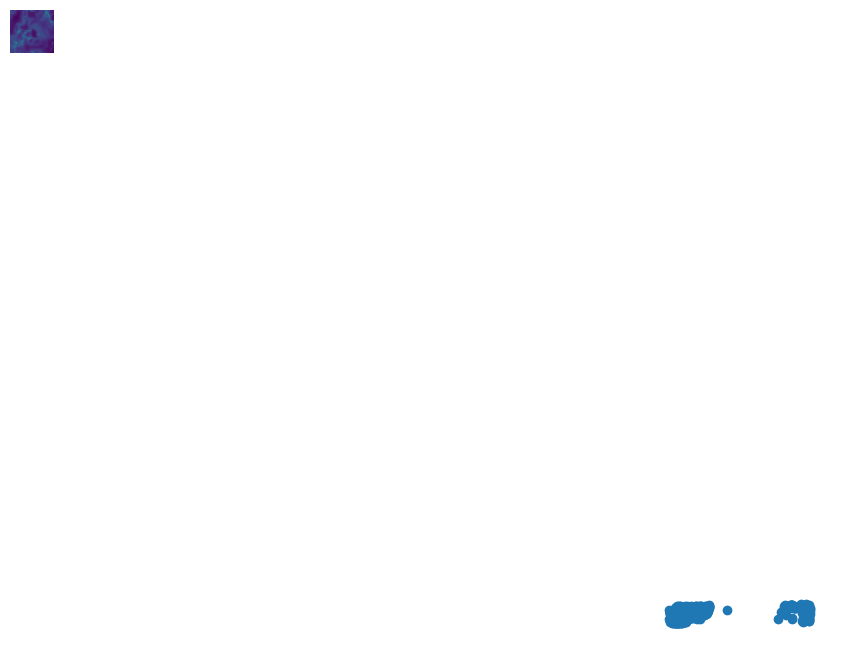

In [19]:
# superimpose network to mIF image
fig, ax = ty.showim(img2)
ty.plot_network(coords, pairs, col_edges='w', ax=ax)
plt.savefig(imdir.joinpath('mIF - Delaunay superimposed'), bbox_inches=('tight'))

## k-nearest neighbors

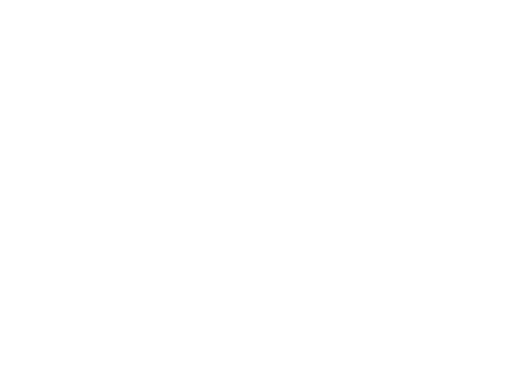

In [20]:
# coords = nodes.loc[:,['x','y']].values
# pairs = ty.build_knn(coords)
# distances = ty.distance_neighbors(coordsty.plot_network(coords, pairs, figsize=(10,10))
plt.axis('off')
plt.savefig(imdir.joinpath('mIF - knn network'), bbox_inches=('tight'))

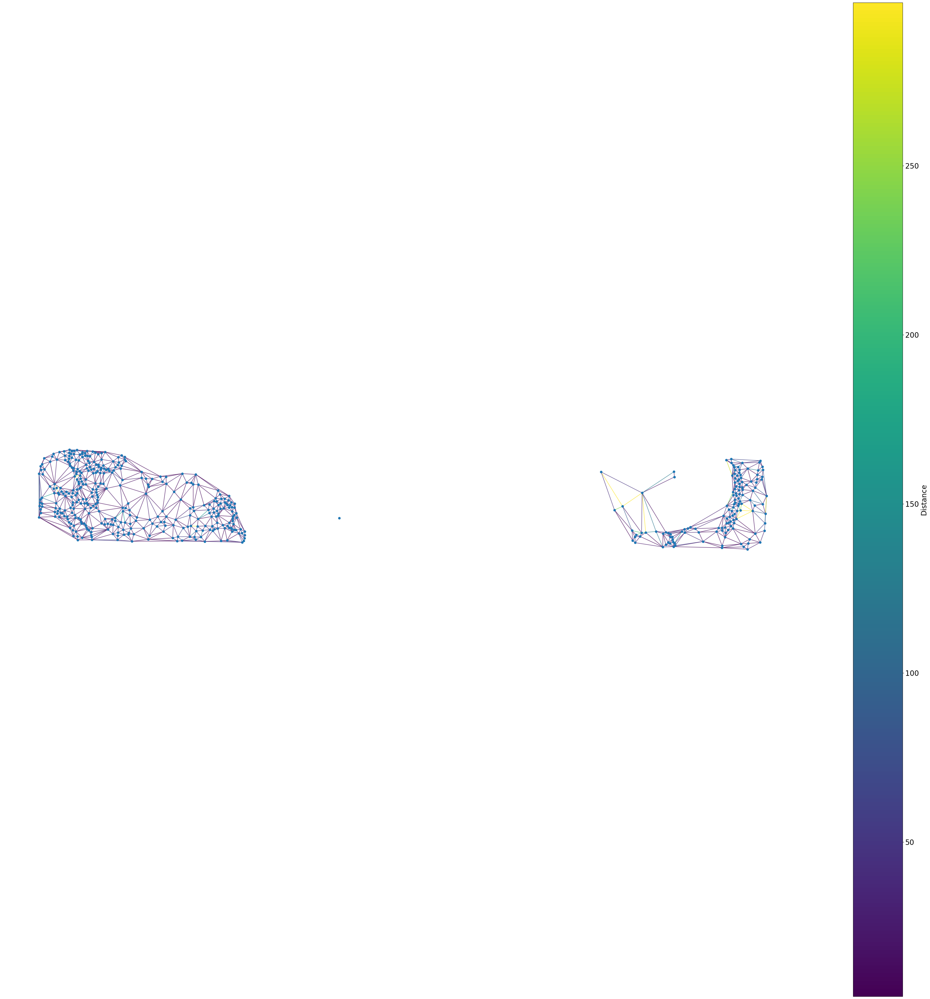

In [21]:
ty.plot_network_distances(coords, pairs, distances, figsize=(50,50))
plt.axis('off')
plt.savefig(imdir.joinpath('mIF - knn distances'), bbox_inches=('tight'))

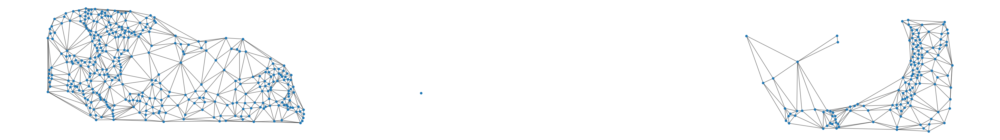

In [22]:
ty.plot_network(coords, pairs, figsize=(50,50))
plt.axis('off')
plt.savefig(imdir.joinpath('mIF - knn network'), bbox_inches=('tight'))

NameError: name 'colors' is not defined

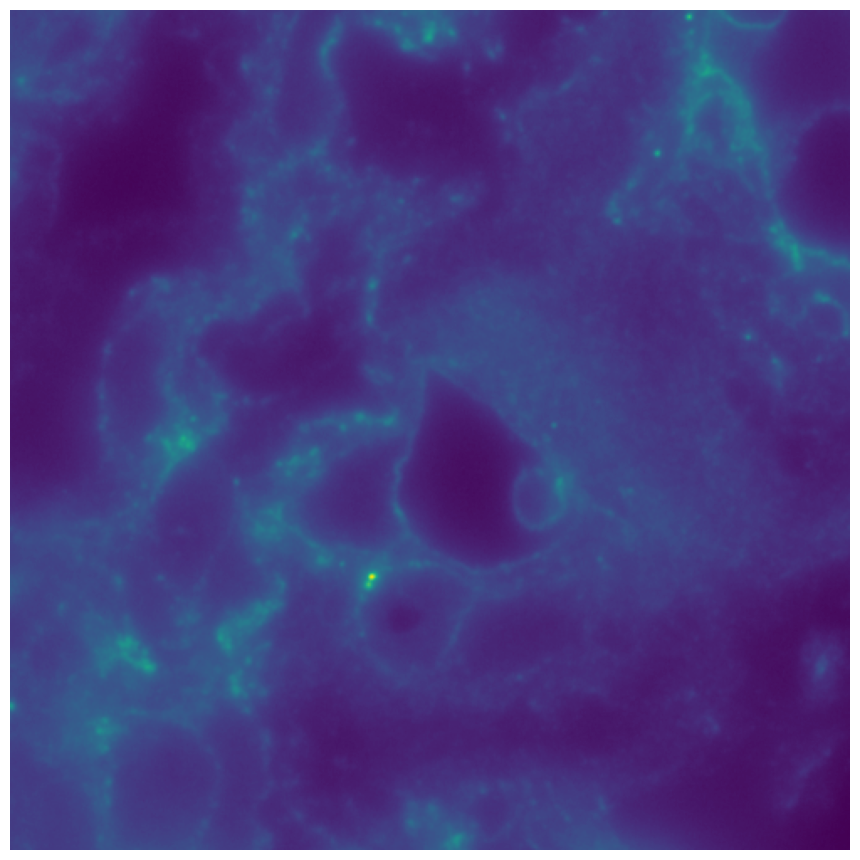

In [23]:
# superimpose network to mIF image
fig, ax = ty.showim(img2)
ty.plot_network(coords, pairs, col_nodes=colors, col_edges='w', ax=ax)
plt.savefig(imdir.joinpath('mIF - knn superimposed'), bbox_inches=('tight'))

## radial distance neighbors

In [24]:
# coords = meta_data.loc[:,['x','y']].values
# pairs = ty.build_rdn(coords, r=60)
# distances = ty.distance_neighbors(coords, pairs)

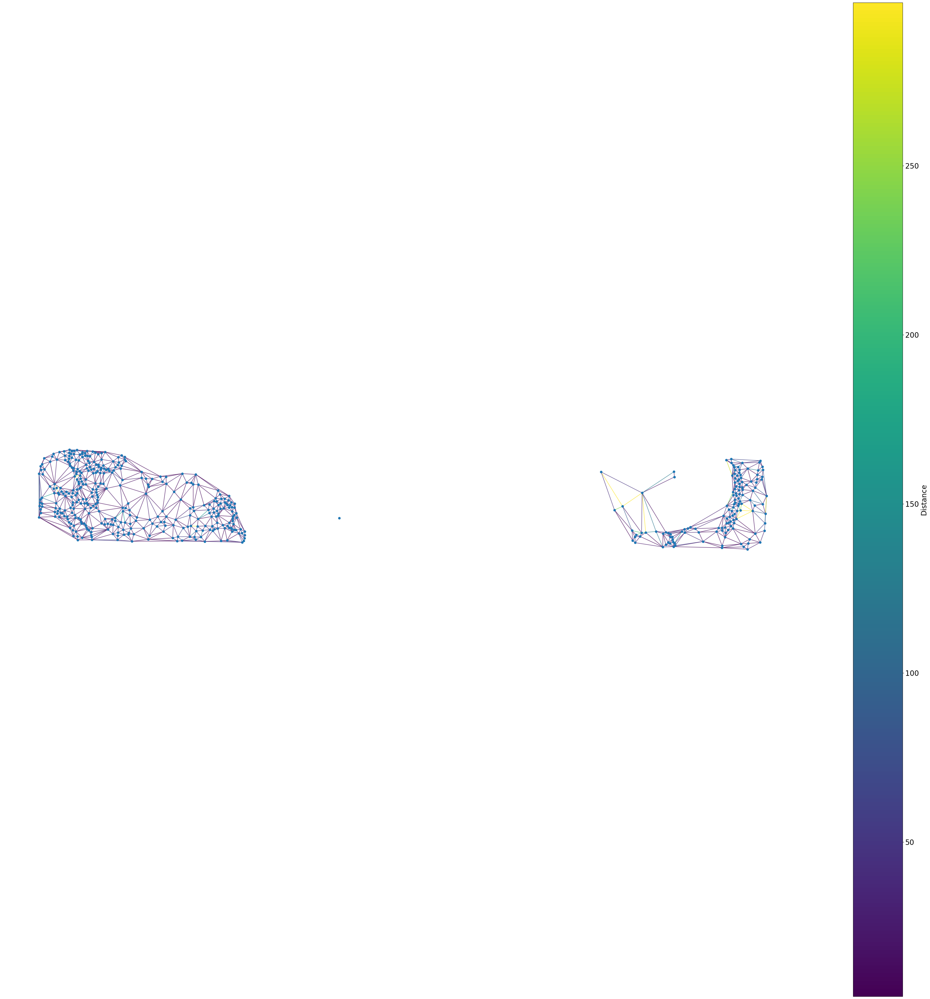

In [25]:
ty.plot_network_distances(coords, pairs, distances, figsize=(50,50))
plt.axis('off')
plt.savefig(imdir.joinpath('mIF - rdn distances'), bbox_inches=('tight'))

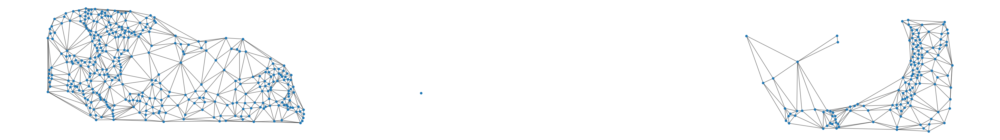

In [26]:
ty.plot_network(coords, pairs, figsize=(50,50))
plt.axis('off')
plt.savefig(imdir.joinpath('mIF - rdn network'), bbox_inches=('tight'))

NameError: name 'colors' is not defined

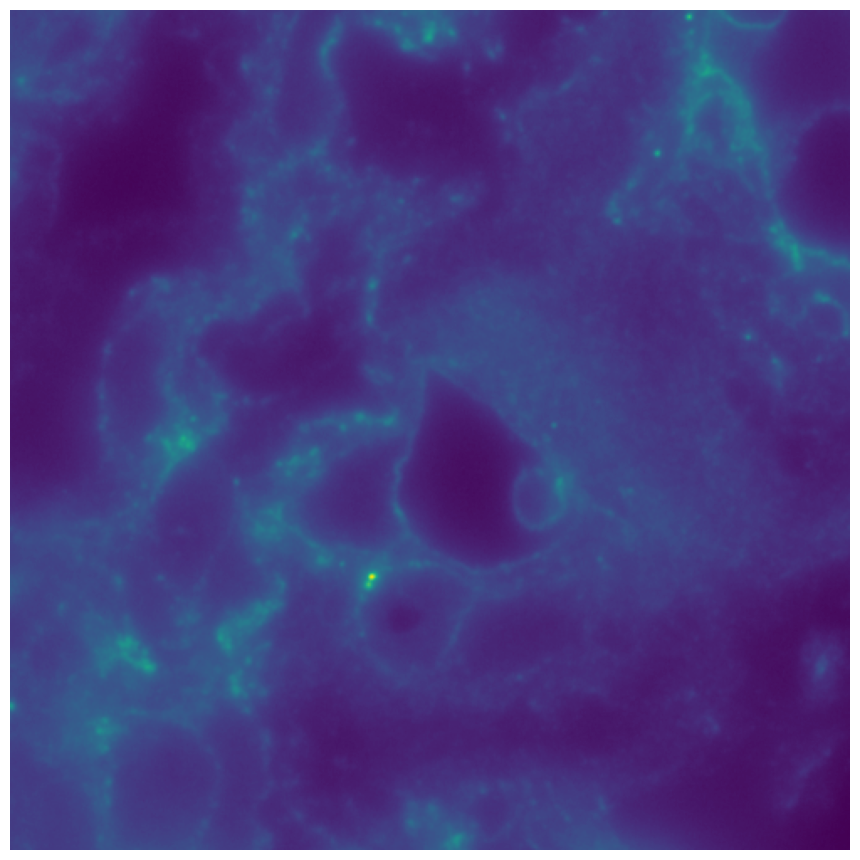

In [27]:
# superimpose network to mIF image
fig, ax = ty.showim(img2)
ty.plot_network(coords, pairs, col_nodes=colors, col_edges='w', ax=ax)
plt.savefig(imdir.joinpath('mIF - rdn superimposed'), bbox_inches=('tight'))

## Performance comparison with PySAL

### Exemple usage of PySAL on previous data

In [37]:
regions, vertices = voronoi(coords)
region_df, point_df = voronoi_frames(coords)

/home/tuanvu/.pyenv/versions/3.8.10/envs/spatial-networks/lib/python3.8/site-packages/libpysal/cg/voronoi.py:173: FutureWarning: You are adding a column named 'geometry' to a GeoDataFrame constructed without an active geometry column. Currently, this automatically sets the active geometry column to 'geometry' but in the future that will no longer happen. Instead, either provide geometry to the GeoDataFrame constructor (GeoDataFrame(... geometry=GeoSeries()) or use `set_geometry('geometry')` to explicitly set the active geometry column.
  region_df["geometry"] = [Polygon(vertices[region]) for region in regions]
/home/tuanvu/.pyenv/versions/3.8.10/envs/spatial-networks/lib/python3.8/site-packages/libpysal/cg/voronoi.py:176: FutureWarning: You are adding a column named 'geometry' to a GeoDataFrame constructed without an active geometry column. Currently, this automatically sets the active geometry column to 'geometry' but in the future that will no longer happen. Instead, either provide g

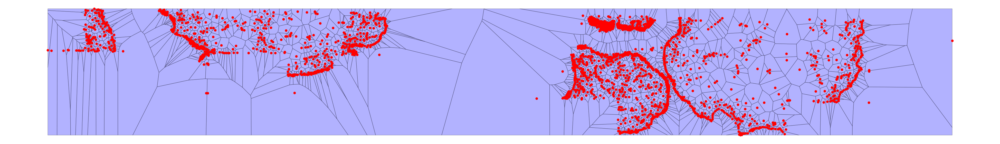

In [39]:
fig, ax = plt.subplots(figsize=(50,50))
region_df.plot(ax=ax, color='blue',edgecolor='black', alpha=0.3)
point_df.plot(ax=ax, color='red')
plt.axis('off')
plt.savefig(imdir.joinpath('mIF - PySAL Voronoi tessellation'), bbox_inches=('tight'))

In [40]:
w_rook = Rook.from_dataframe(point_df)

/home/tuanvu/.pyenv/versions/3.8.10/envs/spatial-networks/lib/python3.8/site-packages/libpysal/cg/voronoi.py:173: FutureWarning: You are adding a column named 'geometry' to a GeoDataFrame constructed without an active geometry column. Currently, this automatically sets the active geometry column to 'geometry' but in the future that will no longer happen. Instead, either provide geometry to the GeoDataFrame constructor (GeoDataFrame(... geometry=GeoSeries()) or use `set_geometry('geometry')` to explicitly set the active geometry column.
  region_df["geometry"] = [Polygon(vertices[region]) for region in regions]
/home/tuanvu/.pyenv/versions/3.8.10/envs/spatial-networks/lib/python3.8/site-packages/libpysal/cg/voronoi.py:176: FutureWarning: You are adding a column named 'geometry' to a GeoDataFrame constructed without an active geometry column. Currently, this automatically sets the active geometry column to 'geometry' but in the future that will no longer happen. Instead, either provide g

In [41]:
w_rook.n

2000

In [42]:
w_rook.pct_nonzero

0.2929

In [43]:
gdf = region_df.join(pd.DataFrame({'dummy_var':np.zeros(region_df.shape[0])}))

TypeError: Passing a dict as an indexer is not supported. Use a list instead.

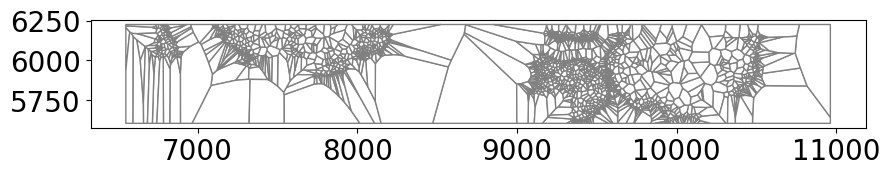

In [44]:
fig, ax = plt.subplots(figsize=(10,10))
ax = gdf.plot(edgecolor='grey', facecolor='w', ax=ax)
fig, ax = w_rook.plot(gdf, ax=ax)
ax.set_axis_off()
plt.savefig(imdir.joinpath('mIF - PySAL Voronoi network'), bbox_inches=('tight'))

In [45]:
# big dictionnary of neighbors:
# w_rook.neighbors

### Test with random data

In [46]:
save_dir = Path('../data/processed/results_execution_timing')
save_dir.mkdir(parents=True, exist_ok=True)
np.random.seed(0)

if RUN_BENCHMARKS:
    sizes = [100, 300, 1000, 3000, 10000, 30000, 100000]
    n_rep = 10
    methods = ['Delaunay no trim', 'Delaunay static trim', 'Delaunay adaptive trim', 'KNN', 'RDN', 'PySAL Voronoi']
    measurements = ['time']
    cols = [
        'size',
        '# nodes',
        'round',
    ]
    cols = cols + [measure + ' ' + meth for meth in methods for measure in measurements]

    record = []
    for size in sizes:
        print(f"benchmarking with size {size}:", end=' ')
        for i in range(n_rep):
            print('*', end='')
            file_name = f"benchmark_execution_timing_size-{size}_round{i}.csv"
            file_path = save_dir / file_name
            
            if file_path.exists():
                print(file_name, "already saved")
                print()
            else:
                coords = ty.make_random_nodes(size=size, ndim=2, expand=True)
                nb_nodes = coords.shape[0]

                record_round = [
                    size,
                    nb_nodes,
                    i,
                ]

                # ------ Delaunay triangulation without edge trimming ------
                tic = time.perf_counter()
                pairs_test = ty.build_delaunay(coords, trim_dist=False)
                toc = time.perf_counter()
                record_round.extend([toc-tic])
                # for the RDN method
                distances = ty.distance_neighbors(coords, pairs_test)
                r_from_delaunay = np.mean(distances) * 1.1

                # ------ Delaunay triangulation with static percentile edge trimming ------
                tic = time.perf_counter()
                pairs_test = ty.build_delaunay(coords, trim_dist='percentile')
                toc = time.perf_counter()
                record_round.extend([toc-tic])

                # ------ Delaunay triangulation with adaptive percentile edge trimming ------
                tic = time.perf_counter()
                pairs_test = ty.build_delaunay(coords)
                toc = time.perf_counter()
                record_round.extend([toc-tic])

                # ------ KNN ------
                tic = time.perf_counter()
                pairs_test = ty.build_knn(coords, k=6)
                toc = time.perf_counter()
                record_round.extend([toc-tic])

                # ------ RDN ------
                tic = time.perf_counter()
                pairs_test = ty.build_rdn(coords, r=r_from_delaunay)
                toc = time.perf_counter()
                record_round.extend([toc-tic])

                # ------ PySAL Voronoi tesselation ------
                tic = time.perf_counter()
                region_df, point_df = voronoi_frames(coords)
                pairs_test = Rook.from_dataframe(point_df).to_adjlist().values[:, :2].astype(int)
                toc = time.perf_counter()
                record_round.extend([toc-tic])

                record_round_series = pd.Series(data=record_round, index=cols)
                record_round_series.to_csv(file_path)
                record.append(record_round)
        print()        
    record = pd.DataFrame(data=record, columns=cols)
    record.to_csv(save_dir / f"benchmark_execution_timing.csv", index=False)
else:
    record = pd.read_csv(save_dir / f"benchmark_execution_timing.csv")

FileNotFoundError: [Errno 2] No such file or directory: '../data/processed/results_execution_timing/benchmark_execution_timing.csv'

In [47]:
col_exclude = ['# nodes', 'round']
select_cols = [x for x in record.columns if x not in col_exclude]
df_mean = record[select_cols].groupby('size').mean()
df_std = record[select_cols].groupby('size').std()
sizes = df_mean.index
df_mean.columns = [x.replace('time ', '') for x in df_mean.columns]
df_std.columns = [x.replace('time ', '') for x in df_std.columns]
df_mean.style.format("{:.3g}")

NameError: name 'record' is not defined

In [48]:
# median and interquartile difference are more robust measures
col_exclude = ['# nodes', 'round']
select_cols = [x for x in record.columns if x not in col_exclude]
df_median = record[select_cols].groupby('size').median()
df_interquart_upper = record[select_cols].groupby('size').quantile(0.75) - df_median
df_interquart_lower = df_median - record[select_cols].groupby('size').quantile(0.25) 
df_median.columns = [x.replace('time ', '') for x in df_median.columns]
df_interquart_lower.columns = [x.replace('time ', '') for x in df_interquart_lower.columns]
df_interquart_upper.columns = [x.replace('time ', '') for x in df_interquart_upper.columns]
df_median.style.format("{:.3g}")

NameError: name 'record' is not defined

NameError: name 'df_mean' is not defined

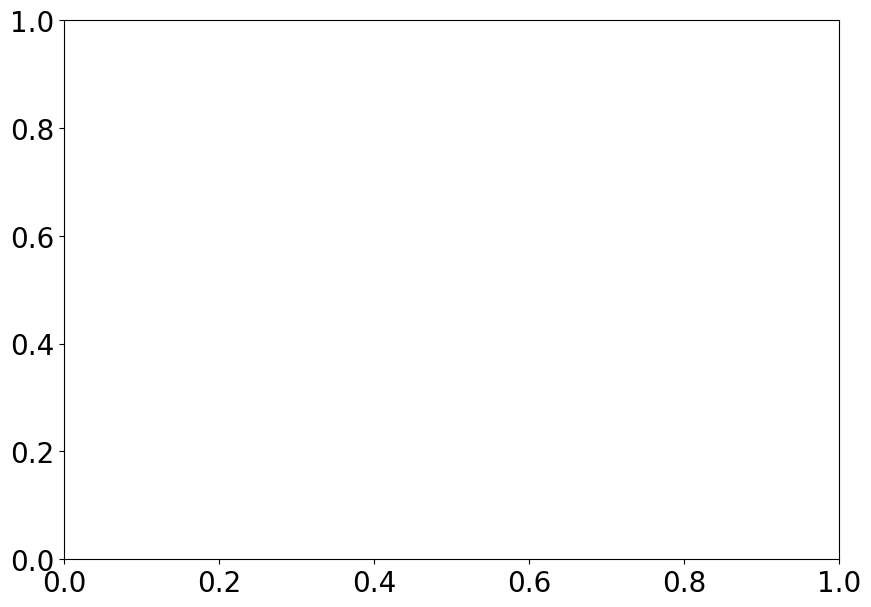

In [49]:
fig, ax = plt.subplots(figsize=(10,7))
for col in df_mean.columns:
    yerr = [df_interquart_lower[col], df_interquart_upper[col]]
    plt.errorbar(sizes, df_median[col], yerr=yerr, label=col, lw=3)
plt.ylabel('time (s)')
plt.xlabel('number of nodes')
plt.legend()
plt.savefig(imdir.joinpath('benchmark median execution time all methods'), bbox_inches=('tight'))

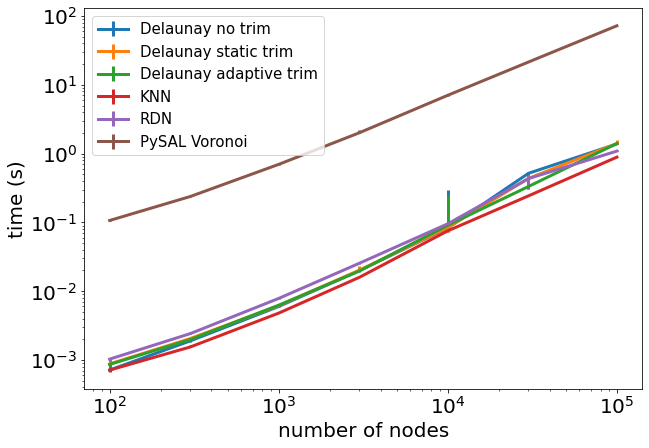

In [32]:
fig, ax = plt.subplots(figsize=(10,7))
for col in df_mean.columns:
    yerr = [df_interquart_lower[col], df_interquart_upper[col]]
    plt.errorbar(sizes, df_median[col], yerr=yerr, label=col, lw=3)
plt.ylabel('time (s)')
plt.xlabel('number of nodes')
ax.set_xscale('log')
ax.set_yscale('log')
plt.legend()
plt.savefig(imdir.joinpath('benchmark median execution time all methods - loglog'), bbox_inches=('tight'))

In [33]:
comp = df_median[['Delaunay adaptive trim' , 'PySAL Voronoi']].copy()
comp.columns = ['tysserand', 'PySAL']
comp['speed up'] = comp['PySAL'] / comp['tysserand']
comp.T.style.format("{:.3g}")

size,100,300,1000,3000,10000,30000,100000
tysserand,0.000863,0.00199,0.00626,0.0197,0.0909,0.333,1.4
PySAL,0.107,0.238,0.698,2.01,7.04,21.4,72.1
speed up,124,120,111,102,77.5,64.4,51.4


In [34]:
# that's for the publication ;-)
print(comp.to_latex(float_format='%.3g')) 

\begin{tabular}{lrrr}
\toprule
{} &  tysserand &  PySAL &  speed up \\
size   &            &        &           \\
\midrule
100    &   0.000863 &  0.107 &       124 \\
300    &    0.00199 &  0.238 &       120 \\
1000   &    0.00626 &  0.698 &       111 \\
3000   &     0.0197 &   2.01 &       102 \\
10000  &     0.0909 &   7.04 &      77.5 \\
30000  &      0.333 &   21.4 &      64.4 \\
100000 &        1.4 &   72.1 &      51.4 \\
\bottomrule
\end{tabular}



Here there is a discrepancy with the figures in the article. After preprint, I fixed the random seed for reproducibility, and speed ups appear even better, which is only due to different sets of random nodes.

## Fake tissue generation

In [35]:
coords, masks, image = ty.make_random_tiles(nb=10, return_image=True, double_pattern=False)

Centers of generated cells

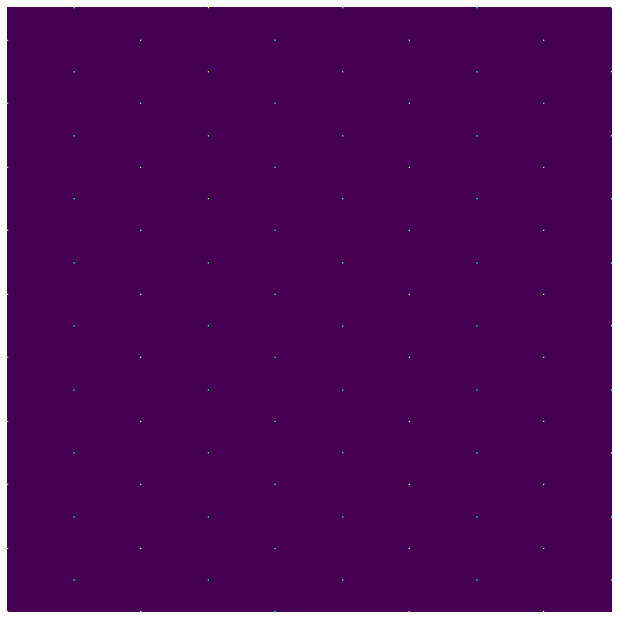

In [36]:
ty.showim(image, origin='lower')
plt.savefig(imdir.joinpath('generated-tissue-seeds'), bbox_inches=('tight'))

Masks are areas of a same integer, if there are K masks, image maximum is K

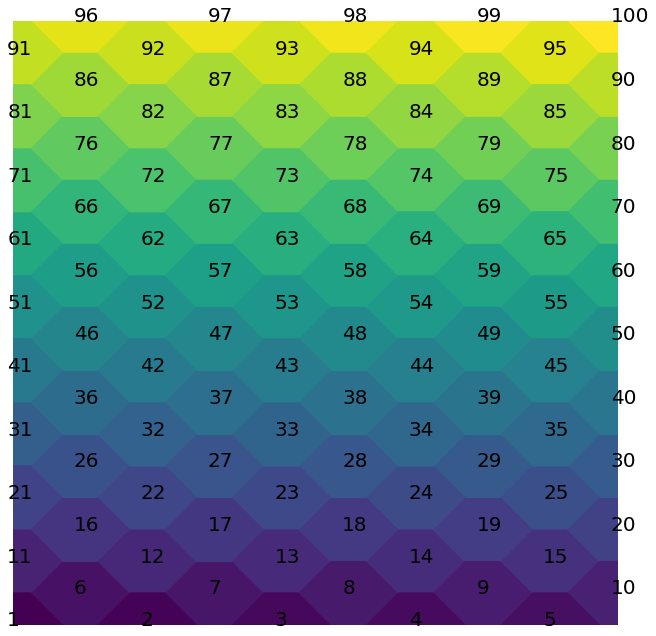

In [37]:
fig, ax = ty.showim(masks, origin='lower')
for (x,y) in coords:
    text = str(masks[y,x])
    plt.text(x-5, y, text, fontdict=None)
plt.savefig(imdir.joinpath('generated-tissue-interger-masks'), bbox_inches=('tight'))

The continuous colormap is misleading: adjacents masks are not distinguishable.  
We use scikit-image's label2rgb to distinguish neighboring masks

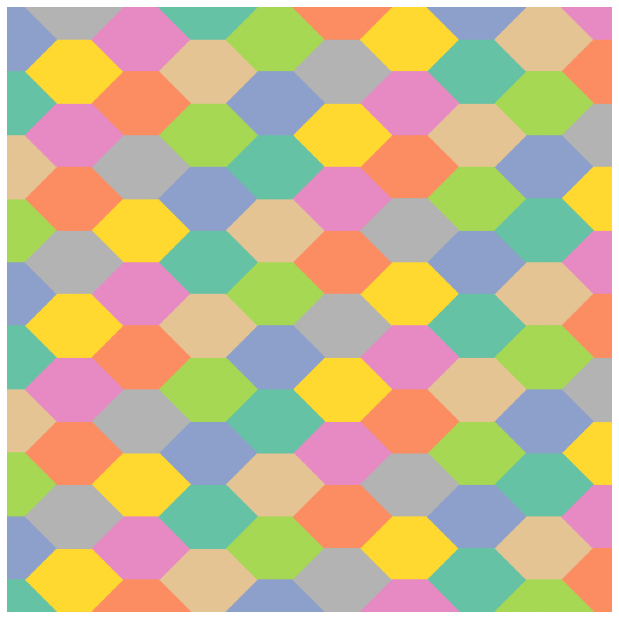

In [38]:
ty.showim(color.label2rgb(masks, bg_label=0, colors=label_cmap), origin='lower')
plt.savefig(imdir.joinpath('generated-tissue-masks'), bbox_inches=('tight'))

In [39]:
pairs = ty.build_contacting(masks)
coords = ty.mask_val_coord(masks)
coords, pairs = ty.refactor_coords_pairs(coords, pairs)
distances = ty.distance_neighbors(coords, pairs)

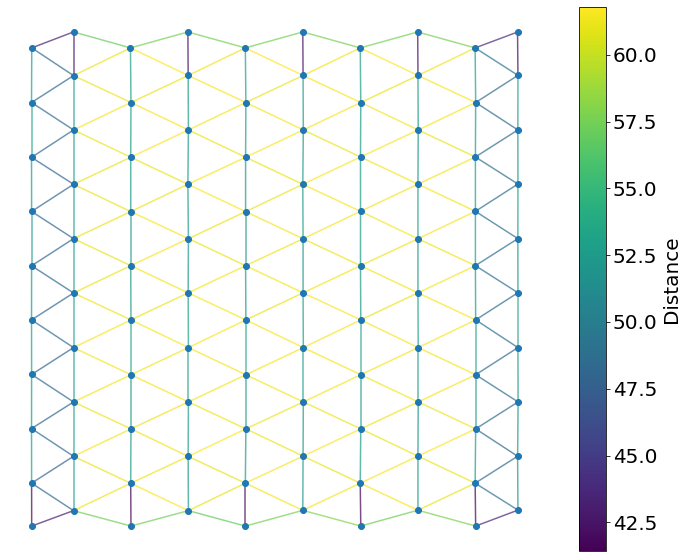

In [40]:
ty.plot_network_distances(coords, pairs, distances, figsize=(13,10))
plt.axis('off');
plt.savefig(imdir.joinpath('generated-tissue-cell-contact'), bbox_inches=('tight'))

In [41]:
linewidth = 3

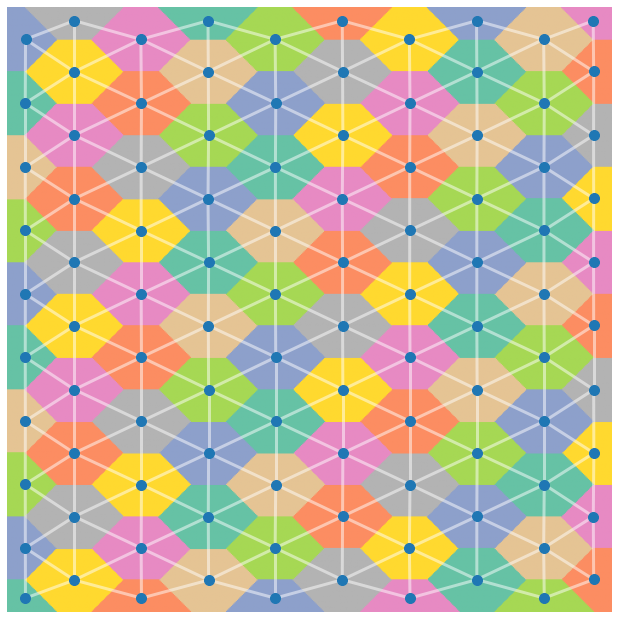

In [42]:
fig, ax = ty.showim(color.label2rgb(masks, bg_label=0, colors=label_cmap), origin='lower')
ty.plot_network(coords, pairs, col_edges='w', size_nodes=100, ax=ax, linewidth=linewidth)
plt.savefig(imdir.joinpath('generated-tissue-cell-contact-superimposition'), bbox_inches=('tight'))

### Coordinates methods on generated tissue

#### Delaunay

In [43]:
coords, masks = ty.make_random_tiles(nb=10)
pairs = ty.build_delaunay(coords, trim_dist=False)
distances = ty.distance_neighbors(coords, pairs)

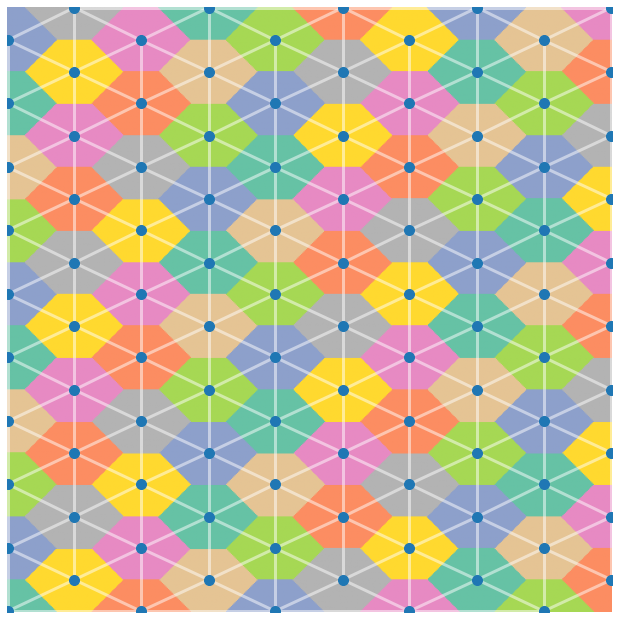

In [44]:
fig, ax = ty.showim(color.label2rgb(masks, bg_label=0, colors=label_cmap), origin='lower')
ty.plot_network(coords, pairs, col_edges='w', size_nodes=100, ax=ax, linewidth=linewidth)
plt.savefig(imdir.joinpath('generated-tissue-delaunay-superimposition'), bbox_inches=('tight'))

#### knn

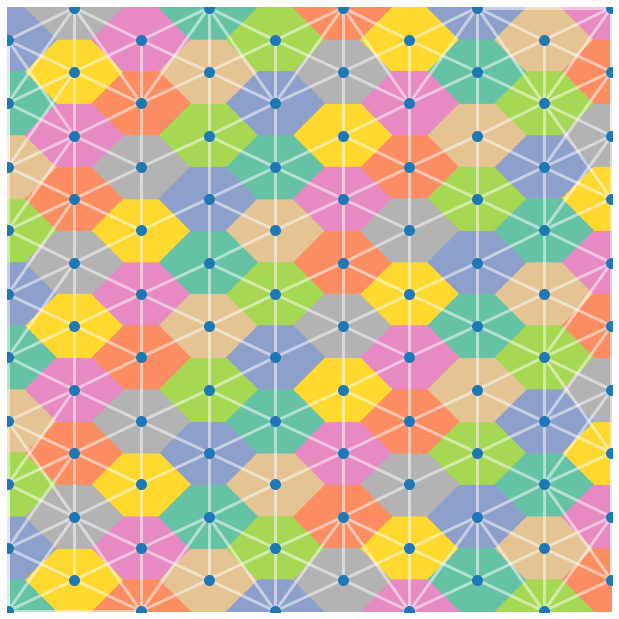

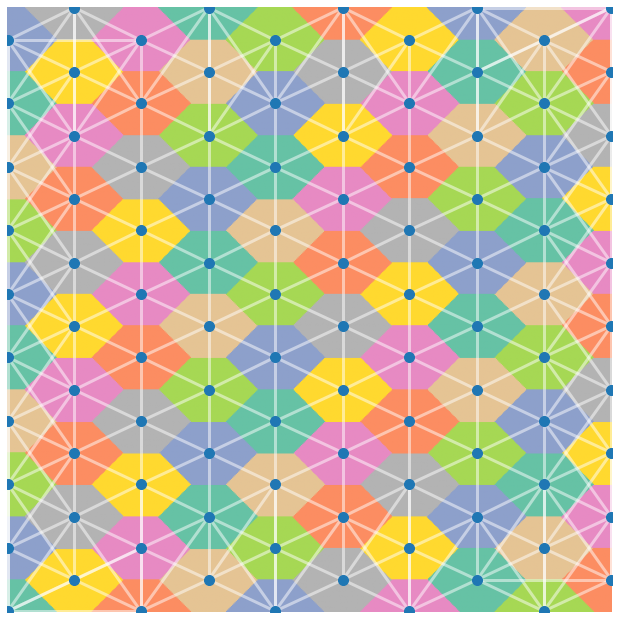

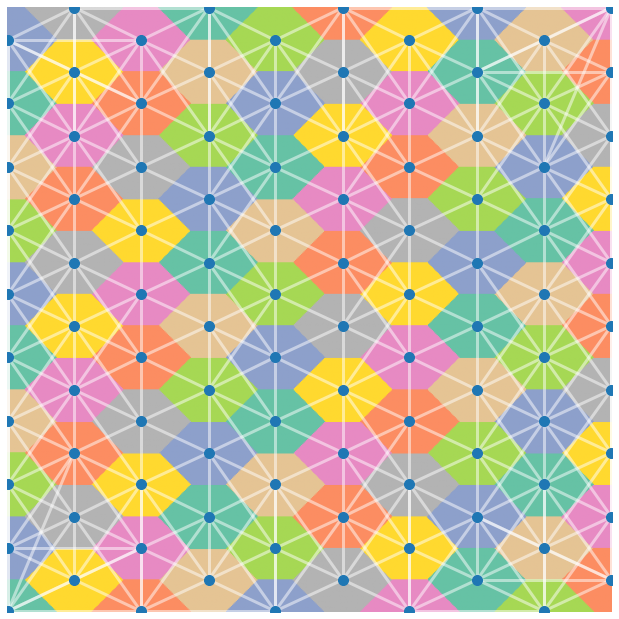

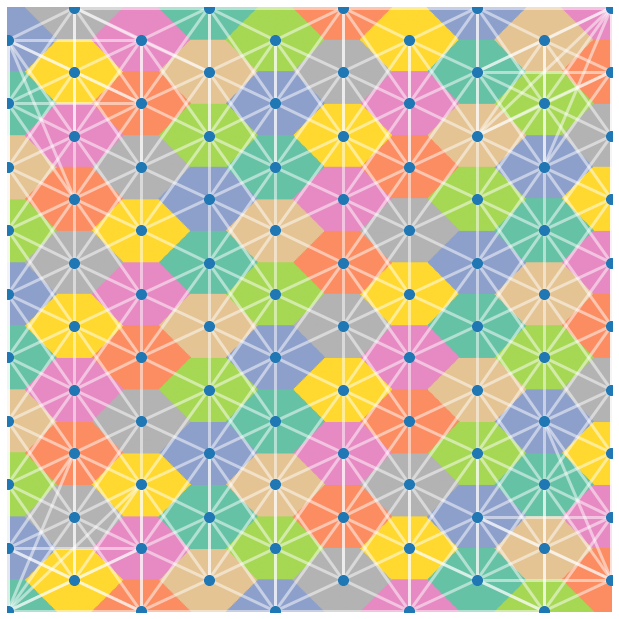

In [45]:
coords, masks = ty.make_random_tiles(nb=10)
for k in [5,6,7,8]:
    pairs = ty.build_knn(coords, k)
    fig, ax = ty.showim(color.label2rgb(masks, bg_label=0, colors=label_cmap), origin='lower')
    ty.plot_network(coords, pairs, col_edges='w', size_nodes=100, ax=ax, linewidth=linewidth)
    plt.savefig(imdir.joinpath('generated-tissue-knn-superimposition_k='+str(k)), bbox_inches=('tight'))

#### rdn

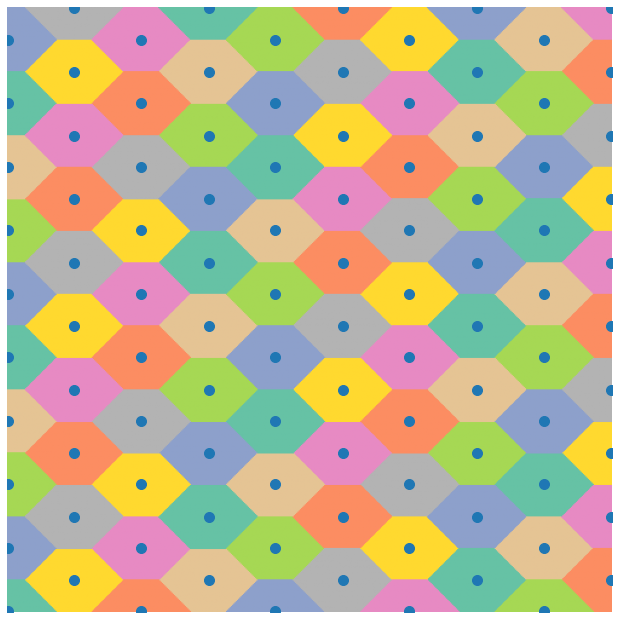

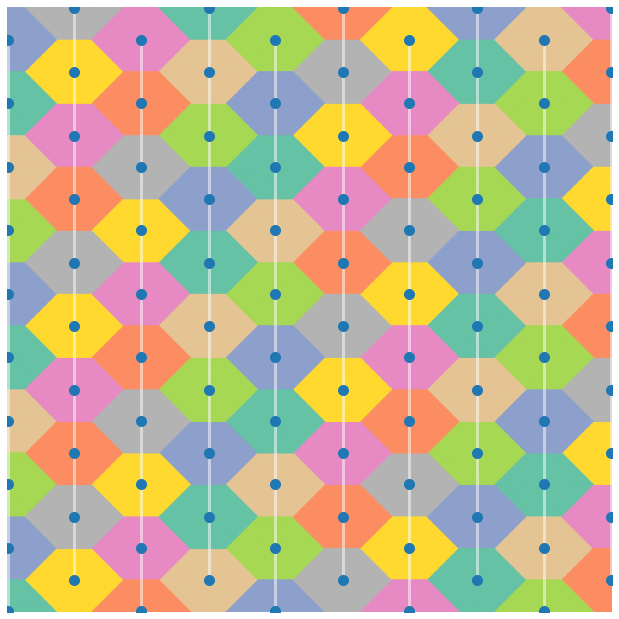

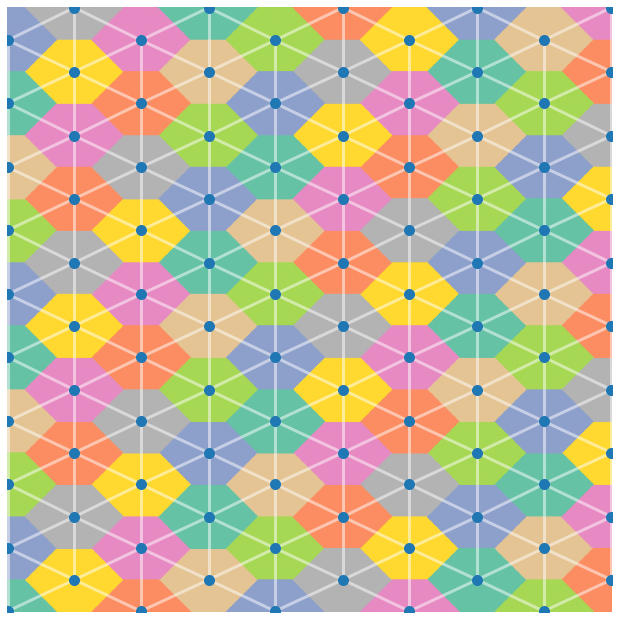

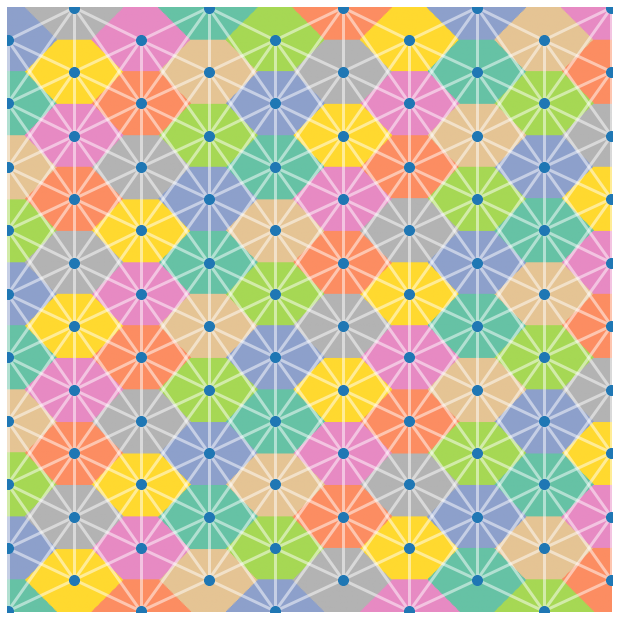

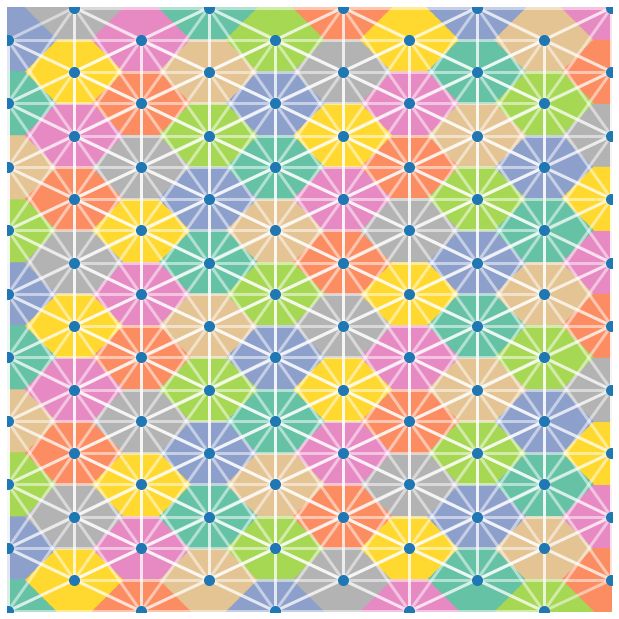

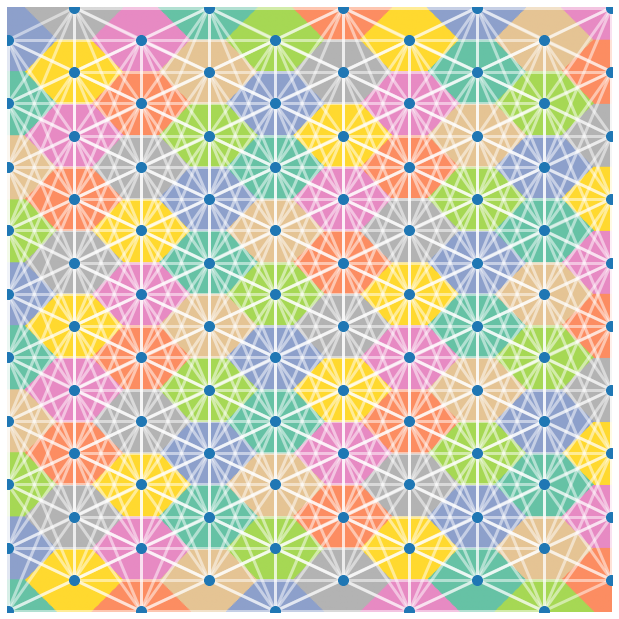

In [46]:
coords, masks = ty.make_random_tiles(nb=10)
for r in [50,55,75,100,125,150]:
    pairs = ty.build_rdn(coords, r)
    fig, ax = ty.showim(color.label2rgb(masks, bg_label=0, colors=label_cmap), origin='lower')
    ty.plot_network(coords, pairs, col_edges='w', size_nodes=100, ax=ax, linewidth=linewidth);
    plt.savefig(imdir.joinpath('generated-tissue-rdn-superimposition_r='+str(r)), bbox_inches=('tight'))

#### rdn on tissue with noise

In [47]:
np.random.seed(0)
coords, masks, image = ty.make_random_tiles(nb=10, return_image=True, noise_sigma=10)

(<Figure size 648x648 with 1 Axes>, <AxesSubplot:>)

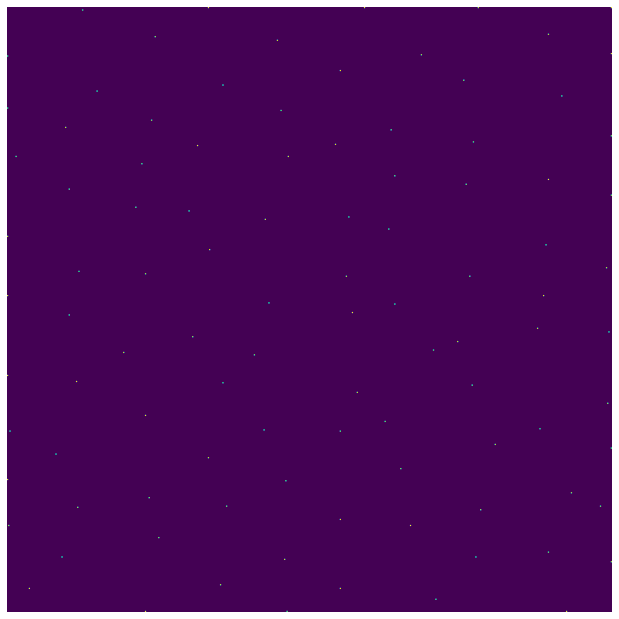

In [48]:
ty.showim(image, origin='lower')

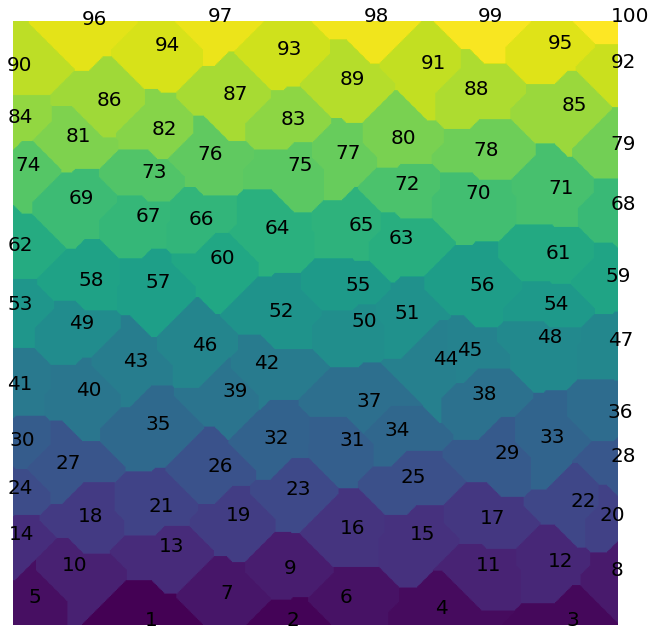

In [49]:
fig, ax = ty.showim(masks, origin='lower')
for (x,y) in coords:
    text = str(masks[y,x])
    plt.text(x-5, y, text, fontdict=None)
plt.savefig(imdir.joinpath('generated-tissue-interger-masks_noise-sigma'), bbox_inches=('tight'))

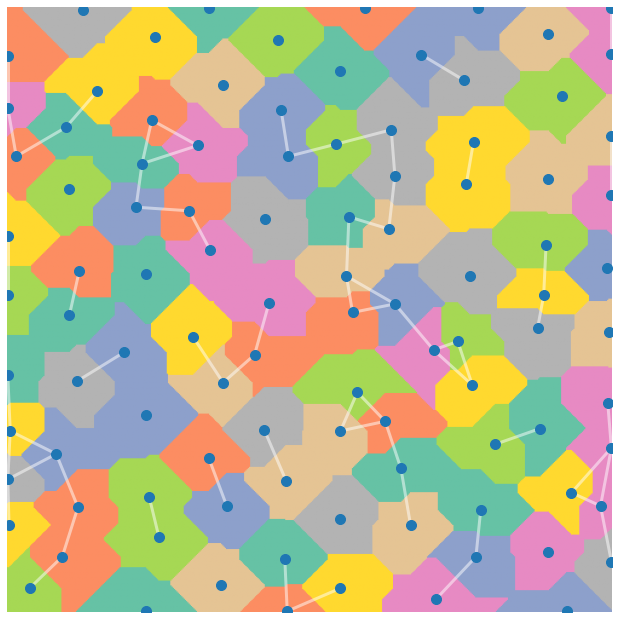

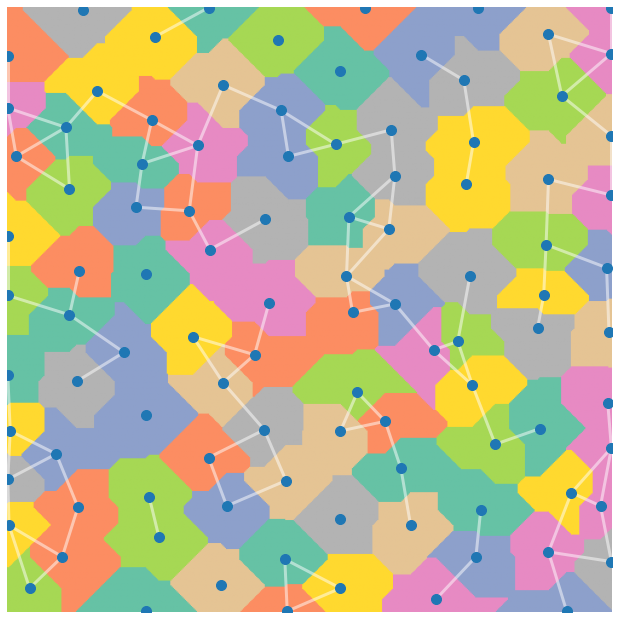

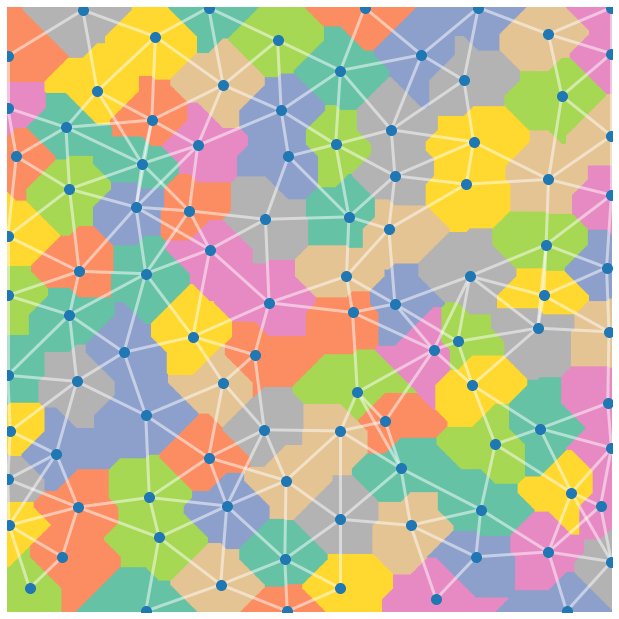

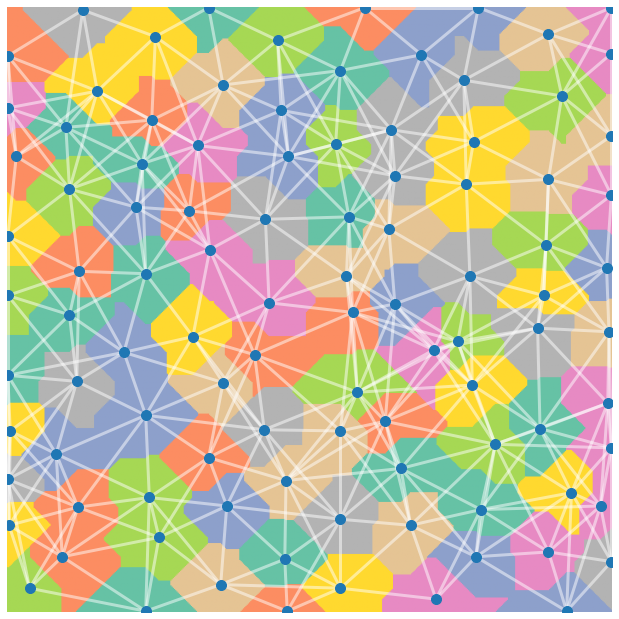

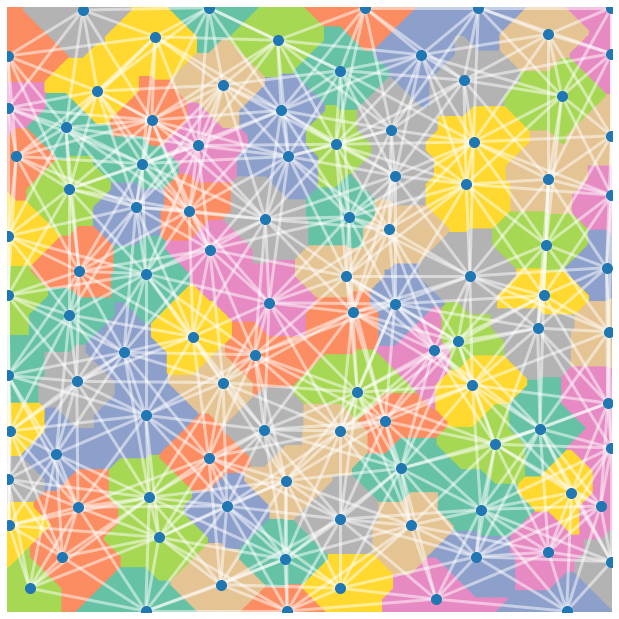

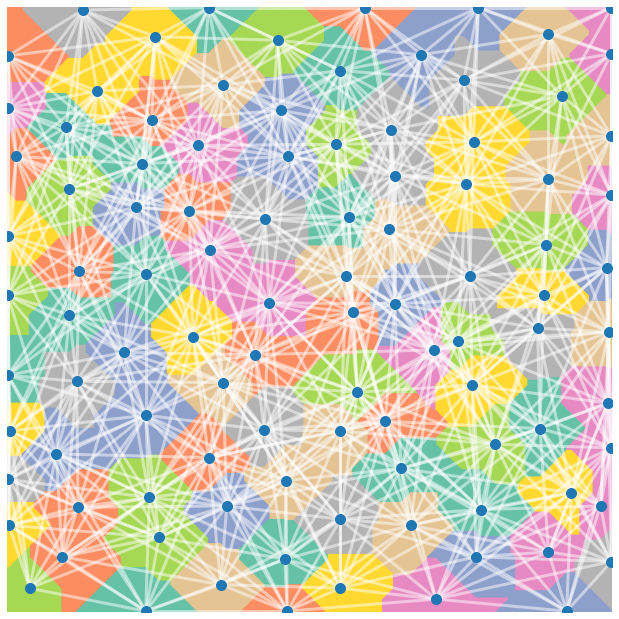

In [50]:
for r in [50,55,75,100,125,150]:
    pairs = ty.build_rdn(coords, r)
    fig, ax = ty.showim(color.label2rgb(masks, bg_label=0, colors=label_cmap), origin='lower')
    ty.plot_network(coords, pairs, col_edges='w', size_nodes=100, ax=ax, linewidth=linewidth);
    plt.savefig(imdir.joinpath('generated-tissue_noise-sigma_rdn-superimposition_r='+str(r)), bbox_inches=('tight'))

### Examplary segmentation images

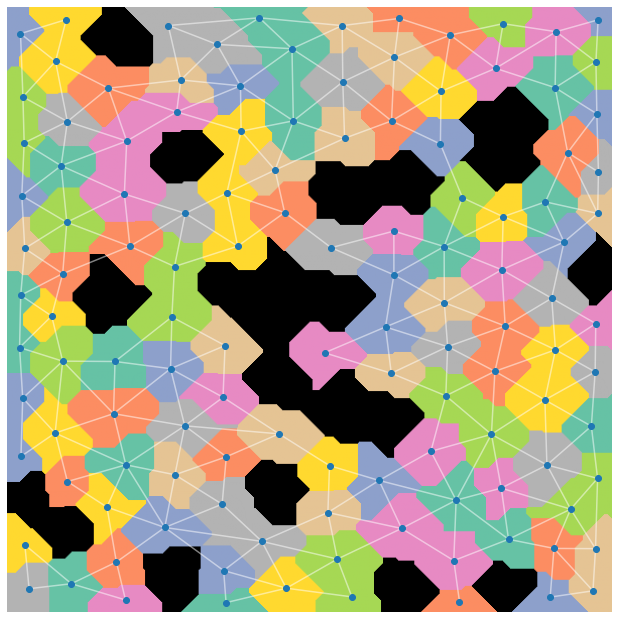

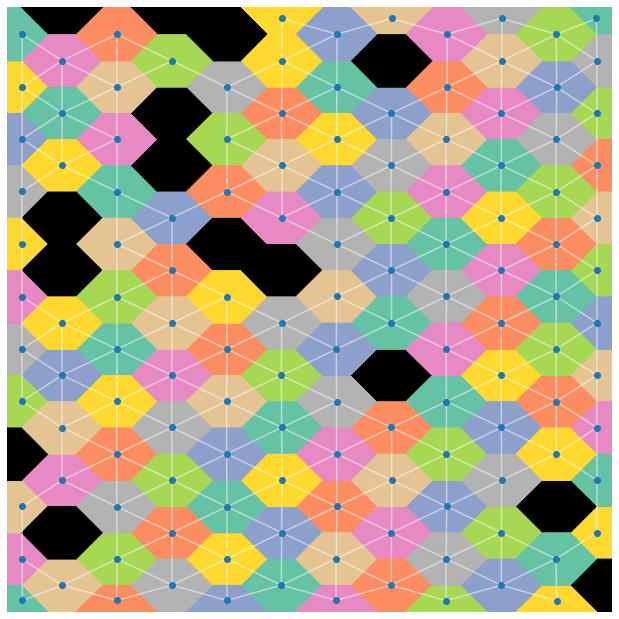

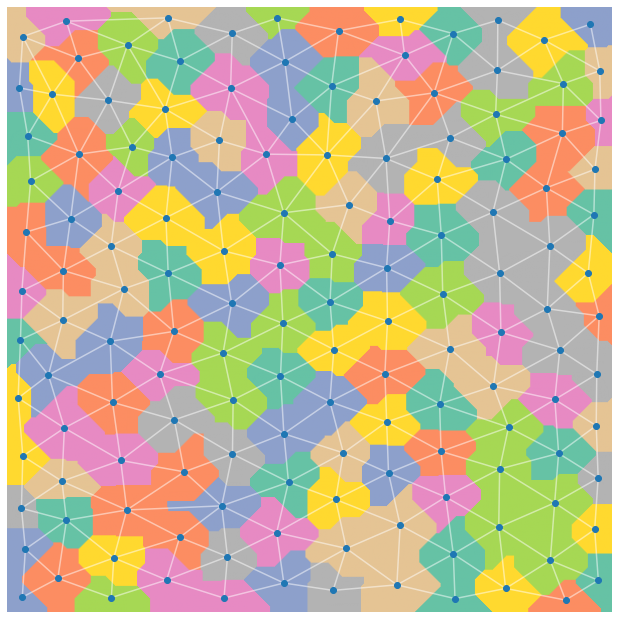

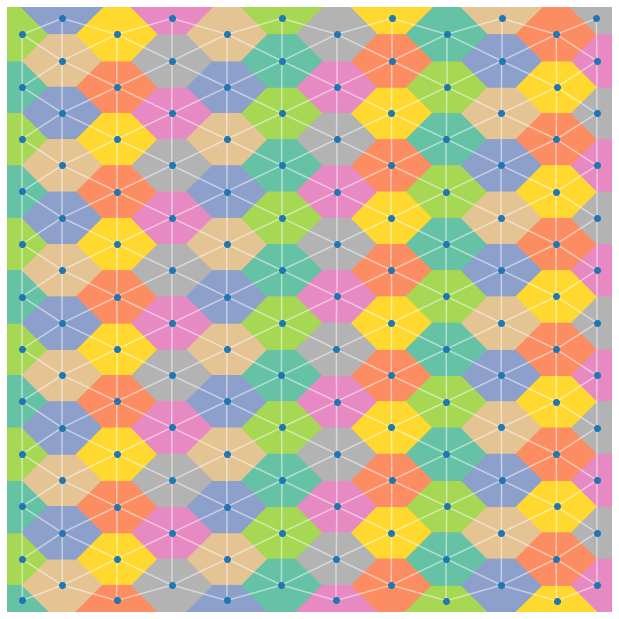

In [51]:
np.random.seed(0)

hole_probas = [0.1, 0]
spacing = 50
noise_sigmas = [spacing / 5 * 1, 0]
sizes = [600]

for size in sizes:
    nb = int(size / spacing)
    for hole_proba in hole_probas:
        for noise_sigma in noise_sigmas:
            
            # generate the tissue image
            coords, masks = ty.make_random_tiles(sx=size, sy=size, nb=nb, noise_sigma=noise_sigma)
            # erase some segmented objects
            if hole_proba != 0:
                for i in np.unique(masks):
                    if np.random.rand() > (1 - hole_proba):
                        masks[masks == i] = 0

            # ------ Contacting areas method ------
            pairs = ty.build_contacting(masks)
            coords = ty.mask_val_coord(masks)
            coords, pairs_true = ty.refactor_coords_pairs(coords, pairs)
            
            # plot and save the reconstructed network
            
            fig, ax = ty.showim(color.label2rgb(masks, bg_label=0, colors=label_cmap), origin='lower')
            
            file_name = f"simulated_segmentation_image_size-{size}_hole_proba-{hole_proba}_noise_sigma-{noise_sigma}_objects_only.png"
            plt.savefig(imdir / file_name, bbox_inches=('tight'))
            ty.plot_network(coords, pairs_true, col_edges='w', ax=ax)
            file_name = f"simulated_segmentation_image_size-{size}_hole_proba-{hole_proba}_noise_sigma-{noise_sigma}_objects_network.png"
            plt.savefig(imdir / file_name, bbox_inches=('tight'))
            plt.show()

## Quality metrics

In order to assess the quality of network reconstructions, we can consider the reconstruction task as a classification task, in which reconstruction models "predict" the presence or absence of edges between each pair of nodes. We can then use the machine learning performance metrics for classification models such as the ROC AUC score, the Matthews correlation coefficient or the balanced accuracy.  
To test the quality of reconstruction while varying several parameters (size of networks, deformation of segmented objects in inputs, ...) we will simulate the required segmentation images. Since they are simulated, the ground truth, or "gold standard", is known, which allows us to evaluate the different methods.

When increasing the number of nodes n in a network, the number of *possible* edges (true negatives) tends to n(n-1)/2, whereas for a "tissue like" network the number of edges increases linearly with n. Thus, with increasing sizes of networks, counting the true negatives would reduce the importance of true positives, false positives and false negatives in performance metrics.  

In [52]:
save_dir = Path('../data/processed/results_quality_size')
save_dir.mkdir(parents=True, exist_ok=True)
np.random.seed(0)

if RUN_BENCHMARKS:
    hole_probas = [0.1, 0]
    spacing = 50
    noise_sigmas = [spacing / 5 * 1, 0]
    nb_nodes_target = np.array([100, 300, 1000, 3000, 10000, 30000])
    sizes = np.ceil(spacing * np.sqrt(nb_nodes_target)).astype(int)
    repeat_small = 10
    repeat_big = 3

    methods = ['Delaunay no trim', 'Delaunay static trim', 'Delaunay adaptive trim', 'KNN', 'RDN', 'PySAL Voronoi']
    measurements = ['time', 'TP ratio', 'FP ratio', 'FN ratio']
    cols = [
        'hole_proba',
        'noise_sigma',
        'size',
        '# nodes',
        '# edges',
        'round',
        'time Contacting',
    ]
    cols = cols + [measure + ' ' + meth for meth in methods for measure in measurements]

    record = []
    for size in sizes:
        nb = int(size / spacing)
        print(f"benchmarking with size: {size}")
        for hole_proba in hole_probas:
            print(f"    Hole probability: {hole_proba}")
            for noise_sigma in noise_sigmas:
                print(f"        Noise sigma: {noise_sigma}")
                if nb < 120:
                    n_rep = repeat_small
                else:
                    n_rep = repeat_big

                for i in range(n_rep):

                    print(f"*", end=' ')
                    file_name = f"benchmark_quality_size-{size}_hole_proba-{hole_proba}_noise_sigma-{noise_sigma}_round{i}.csv"
                    file_path = save_dir / file_name
                    if file_path.exists():
                        print(file_name, "already saved")
                    else:
                        coords, masks = ty.make_random_tiles(sx=size, sy=size, nb=nb, noise_sigma=noise_sigma)
                        nb_nodes = coords.shape[0]

                        # erase some segmented objects
                        if hole_proba != 0:
                            for i in np.unique(masks):
                                if np.random.rand() > (1 - hole_proba):
                                    masks[masks == i] = 0

                        # ------ Ground truth ------
                        tic = time.perf_counter()
                        pairs = ty.build_contacting(masks)
                        coords = ty.mask_val_coord(masks)
                        coords, pairs_true = ty.refactor_coords_pairs(coords, pairs)
                        toc = time.perf_counter()
                        pairs_true = ty.double_sort(pairs_true)
                        duration = toc - tic
                        nb_edges = pairs_true.shape[0]

                        record_round = [
                            hole_proba,
                            noise_sigma,
                            size,
                            nb_nodes,
                            nb_edges,
                            i,
                            duration,
                        ]

                        # ------ Delaunay triangulation without edge trimming ------
                        tic = time.perf_counter()
                        pairs_test = ty.build_delaunay(coords, trim_dist=False)
                        toc = time.perf_counter()
                        pairs_test = ty.double_sort(pairs_test)
                        true_pos_rate, false_pos_rate, false_neg_rate = ty.score_method(pairs_true, pairs_test)
                        record_round.extend([toc-tic, true_pos_rate, false_pos_rate, false_neg_rate])

                        # ------ Delaunay triangulation with static percentile edge trimming ------
                        tic = time.perf_counter()
                        pairs_test = ty.build_delaunay(coords, trim_dist='percentile')
                        toc = time.perf_counter()
                        pairs_test = ty.double_sort(pairs_test)
                        true_pos_rate, false_pos_rate, false_neg_rate = ty.score_method(pairs_true, pairs_test)
                        record_round.extend([toc-tic, true_pos_rate, false_pos_rate, false_neg_rate])

                        # ------ Delaunay triangulation with adaptive percentile edge trimming ------
                        tic = time.perf_counter()
                        pairs_test = ty.build_delaunay(coords)
                        toc = time.perf_counter()
                        pairs_test = ty.double_sort(pairs_test)
                        true_pos_rate, false_pos_rate, false_neg_rate = ty.score_method(pairs_true, pairs_test)
                        record_round.extend([toc-tic, true_pos_rate, false_pos_rate, false_neg_rate])

                        # ------ KNN ------
                        tic = time.perf_counter()
                        pairs_test = ty.build_knn(coords, k=6)
                        toc = time.perf_counter()
                        pairs_test = ty.double_sort(pairs_test)
                        true_pos_rate, false_pos_rate, false_neg_rate = ty.score_method(pairs_true, pairs_test)
                        record_round.extend([toc-tic, true_pos_rate, false_pos_rate, false_neg_rate])

                        # ------ RDN ------
                        tic = time.perf_counter()
                        pairs_test = ty.build_rdn(coords, r=75)
                        toc = time.perf_counter()
                        pairs_test = ty.double_sort(pairs_test)
                        true_pos_rate, false_pos_rate, false_neg_rate = ty.score_method(pairs_true, pairs_test)
                        record_round.extend([toc-tic, true_pos_rate, false_pos_rate, false_neg_rate])

                        # ------ PySAL Voronoi tesselation ------
                        tic = time.perf_counter()
                        region_df, point_df = voronoi_frames(coords)
                        pairs_test = Rook.from_dataframe(point_df).to_adjlist().values[:, :2].astype(int)
                        toc = time.perf_counter()
                        pairs_test = ty.double_sort(pairs_test)
                        true_pos_rate, false_pos_rate, false_neg_rate = ty.score_method(pairs_true, pairs_test)
                        record_round.extend([toc-tic, true_pos_rate, false_pos_rate, false_neg_rate])

                        record_round_series = pd.Series(data=record_round, index=cols)
                        record_round_series.to_csv(file_path)
                        record.append(record_round)
                    print()

    record = pd.DataFrame(data=record, columns=cols)
    record.to_csv(save_dir / f"quality_reconstruction_simulated_images.csv", index=False)

In [53]:
import re

# load the intermediate files if the benchmark has not completed
results_paths = save_dir.glob("*_round[0-9].csv")
results = []
for path in results_paths:
#     if 'proba-0.1_noise_sigma-10.0' in str(path):
    data = pd.read_csv(path, index_col=0).T
    # there was an issue with recording the round in the csv
    # but it's in the file name
    data['round'] = int(re.search('round(.+?).csv', str(path)).group(1))
    results.append(data.values)
results = np.vstack(results)
df = pd.DataFrame(data=results, columns=data.columns)
df['size'] = df['size'].astype(int)

In [54]:
# df_sel = df.loc[:, select_4].T.iloc[:, 2:]
df_mean = df.groupby(['hole_proba', 'noise_sigma', 'size']).mean()
df_std = df.groupby(['hole_proba', 'noise_sigma', 'size']).std()
df_mean

# nodes       # edges  round  time Contacting  \
hole_proba noise_sigma size                                                  
0.0        0.0         500     100.0    261.000000    4.5         0.032877   
                       867     324.0    901.000000    4.5         0.238640   
                       1582   1024.0   2945.000000    4.5         4.197770   
                       2739   2916.0   8533.000000    4.5        47.381321   
                       5000  10000.0  29601.000000    4.5       541.826835   
                       8661  30276.0  90133.000000    1.0      5004.341595   
           10.0        500     100.0    261.200000    4.5         0.032048   
                       867     324.0    898.300000    4.5         0.194358   
                       1582   1024.0   2940.900000    4.5         2.840738   
                       2739   2916.0   8515.900000    4.5        45.793344   
                       5000  10000.0  29527.600000    4.5       544.505293   
                       8661  30276.0  89895.666667    1.0      4993.178595   
0.1        0.0         500     100.0    216.900000    4.5         0.033196   
                       867     324.0    735.400000    4.5         0.304298   
                       1582   1024.0   2385.400000    4.5         4.723202   
                       2739   2916.0   6885.000000    4.5        46.509905   
                       5000  10000.0  24040.400000    4.5       530.590668   
                       8661  30276.0  73006.000000    1.0      4919.919186   
           10.0        500     100.0    215.300000    4.5         0.031029   
                       867     324.0    736.100000    4.5         0.168021   
                       1582   1024.0   2379.600000    4.5         2.005240   
                       2739   2916.0   6867.300000    4.5        36.306790   
                       5000  10000.0  23988.400000    4.5       536.539205   
                       8661  30276.0  72832.000000    1.0      4965.576734   

                             time Delaunay no trim  TP ratio Delaunay no trim  \
hole_proba noise_sigma size                                                     
0.0        0.0         500                0.000579                   0.928826   
                       867                0.001684                   0.960554   
                       1582               0.005759                   0.969707   
                       2739               0.048383                   0.983518   
                       5000               0.152379                   0.988215   
                       8661               0.531041                   0.993836   
           10.0        500                0.000443                   0.897313   
                       867                0.001342                   0.905270   
                       1582               0.004630                   0.924916   
                       2739               0.047329                   0.936731   
                       5000               0.123745                   0.939702   
                       8661               0.441904                   0.943997   
0.1        0.0         500                0.000619                   0.855086   
                       867                0.001752                   0.868222   
                       1582               0.005753                   0.886236   
                       2739               0.033366                   0.884095   
                       5000               0.132424                   0.895870   
                       8661               0.454858                   0.924558   
           10.0        500                0.000463                   0.822418   
                       867                0.001182                   0.823358   
                       1582               0.003757                   0.838272   
                       2739               0.019251                   0.847079   
                       5000               0.132091      

In [55]:
inspect_cols = [x for x in df.columns if x.startswith('TP')]
inspect_df = df_mean[inspect_cols]

cm = sns.light_palette("green", as_cmap=True)

str_fmt = "{:.3f}"
fmt_cols = {inspect_col: str_fmt for inspect_col in inspect_cols}
s = inspect_df.style.background_gradient(cmap=cm, axis=1).format(fmt_cols)
s

### On manually annotated bioimage network

In [56]:
methods = ['Delaunay no trim', 'Delaunay static trim', 'Delaunay adaptive trim', 'KNN', 'RDN', 'PySAL Voronoi']
measurements = ['time', 'TP ratio', 'FP ratio', 'FN ratio']
cols = ['# nodes', '# edges'] + \
       [measure + ' ' + meth for meth in methods for measure in measurements]

# ------ Ground truth ------
annotations = joblib.load('../data/mIF_WSI_tile/annotations_manually_curated_automatic_cleaned.pkl')
coords = annotations['nodes_coords']
pairs_true = annotations['pairs']
pairs_true = ty.double_sort(pairs_true)
nb_nodes = coords.shape[0]
nb_edges = pairs_true.shape[0]

record = [
    nb_nodes,
    nb_edges,
]

np.random.seed(0)
# ------ Delaunay triangulation without edge trimming ------
tic = time.perf_counter()
pairs_test = ty.build_delaunay(coords, trim_dist=False)
toc = time.perf_counter()
pairs_test = ty.double_sort(pairs_test)
true_pos_rate, false_pos_rate, false_neg_rate = ty.score_method(pairs_true, pairs_test)
record.extend([toc-tic, true_pos_rate, false_pos_rate, false_neg_rate])

# ------ Delaunay triangulation with static percentile edge trimming ------
tic = time.perf_counter()
pairs_test = ty.build_delaunay(coords, trim_dist='percentile')
toc = time.perf_counter()
pairs_test = ty.double_sort(pairs_test)
true_pos_rate, false_pos_rate, false_neg_rate = ty.score_method(pairs_true, pairs_test)
record.extend([toc-tic, true_pos_rate, false_pos_rate, false_neg_rate])
# for the RDN method
distances = ty.distance_neighbors(coords, pairs_test)
r_from_delaunay = np.mean(distances) * 1.1

# ------ Delaunay triangulation with adaptive percentile edge trimming ------
tic = time.perf_counter()
pairs_test = ty.build_delaunay(coords)
toc = time.perf_counter()
pairs_test = ty.double_sort(pairs_test)
true_pos_rate, false_pos_rate, false_neg_rate = ty.score_method(pairs_true, pairs_test)
record.extend([toc-tic, true_pos_rate, false_pos_rate, false_neg_rate])

# ------ KNN ------
tic = time.perf_counter()
pairs_test = ty.build_knn(coords, k=6)
toc = time.perf_counter()
pairs_test = ty.double_sort(pairs_test)
true_pos_rate, false_pos_rate, false_neg_rate = ty.score_method(pairs_true, pairs_test)
record.extend([toc-tic, true_pos_rate, false_pos_rate, false_neg_rate])

# ------ RDN ------
tic = time.perf_counter()
pairs_test = ty.build_rdn(coords, r=r_from_delaunay)
toc = time.perf_counter()
pairs_test = ty.double_sort(pairs_test)
true_pos_rate, false_pos_rate, false_neg_rate = ty.score_method(pairs_true, pairs_test)
record.extend([toc-tic, true_pos_rate, false_pos_rate, false_neg_rate])

# ------ PySAL Voronoi tesselation ------
tic = time.perf_counter()
region_df, point_df = voronoi_frames(coords)
pairs_test = Rook.from_dataframe(point_df).to_adjlist().values[:, :2].astype(int)
toc = time.perf_counter()
pairs_test = ty.double_sort(pairs_test)
true_pos_rate, false_pos_rate, false_neg_rate = ty.score_method(pairs_true, pairs_test)
record.extend([toc-tic, true_pos_rate, false_pos_rate, false_neg_rate])

record = pd.Series(data=record, index=cols)
record.to_csv(save_dir / f"quality_reconstruction_annotated_bioimage.csv")

/home/alexis/.pyenv/versions/3.8.10/envs/spatial-networks/lib/python3.8/site-packages/libpysal/weights/util.py:1073: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  data = np.vstack([np.array(shape.centroid) for shape in first_choice])


In [57]:
record = pd.read_csv(save_dir / f"quality_reconstruction_annotated_bioimage.csv", index_col=0)
record#.style.format("{:.3g}")

,0
# nodes,964.000000
# edges,2687.000000
time Delaunay no trim,0.005823
TP ratio Delaunay no trim,0.931226
FP ratio Delaunay no trim,0.066690
FN ratio Delaunay no trim,0.002084
time Delaunay static trim,0.006207
TP ratio Delaunay static trim,0.940702
FP ratio Delaunay static trim,0.057193
FN ratio Delaunay static trim,0.002105


In [58]:
df = record.T
inspect_cols = [x for x in df.columns if x.startswith('TP')]
inspect_df = df[inspect_cols]
inspect_df.columns = [x.replace('TP ratio ', '') for x in inspect_df.columns]

inspect_cols = [x for x in df.columns if x.startswith('time')]
df_time = df[inspect_cols]
df_time.columns = [x.replace('time ', '') for x in df_time.columns]
inspect_df = inspect_df.append(df_time)
inspect_df.index = ['TP ratio', 'time (s)']

cm = sns.light_palette("green", as_cmap=True)

s = inspect_df.style.format("{:.3g}")
s

,Delaunay no trim,Delaunay static trim,Delaunay adaptive trim,KNN,RDN,PySAL Voronoi
TP ratio,0.931,0.941,0.977,0.718,0.648,0.954
time (s),0.00582,0.00621,0.00636,0.00505,0.00673,1.07


# End